In [1]:
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import pandas as pd


In [2]:
from scipy.fftpack import fft
from scipy.io import wavfile

In [3]:
#rename your file or load your own wav file by changing the string value 'audio.wav' to whatever you have to.

#fsamplerate per second
#44100 data points each second for a 6min and 37 sec soundtrack, equals almost 17m data points.
samplerate, data = wavfile.read('audio.wav')
data.shape

(17476608, 2)

In [4]:
df = pd.DataFrame(data[4650000:4900000,:2])
print(f"number of channels = {data.shape[1]}")
length = data.shape[0] / samplerate
print(f"time length of the track = {length}s")

number of channels = 2
time length of the track = 396.2949659863946s


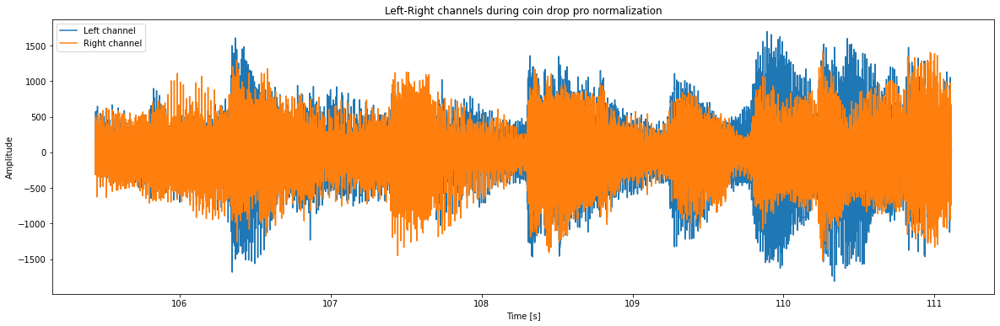

In [5]:
#I picked the specific data range, because it was during the 105th and 110th second that you can hear the coin drop.
plt.rcParams["figure.figsize"] = (20,6)
time = np.linspace(0., length, data.shape[0])
plt.plot(time[4650000:4900000], data[4650000:4900000,0], label="Left channel")
plt.plot(time[4650000:4900000], data[4650000:4900000,1], label="Right channel")
plt.legend()
plt.title('Left-Right channels during coin drop pro normalization')
plt.xlabel("Time [s]")
plt.ylabel("Amplitude")
plt.show()


In [6]:
#Separating left from right data, by picking columns 0 and 1 accordingly.
#and then normalizing the data
#you can normalize in many ways (hopefully from -1 to +1 range, 
#after some trial and error I finally chose normal distribution normalization.
#BUT the way I found online and worked well too, was the following
#play around!
left=data[4650000:4900000,0]
left=(left/(2**10))+0.05
right=data[4650000:4900000,1]
right=(right/(2**10))+0.05

print( "Left channel minimum value: " ,left.min())
print( "Left channel maximum value: " ,left.max())
print( "Right channel minimum value: " ,right.min())
print( "Right channel maximum value: " ,right.max())

Left channel minimum value:  -1.7205078125
Left channel maximum value:  1.7072265625
Right channel minimum value:  -1.4333984375
Right channel maximum value:  1.423046875


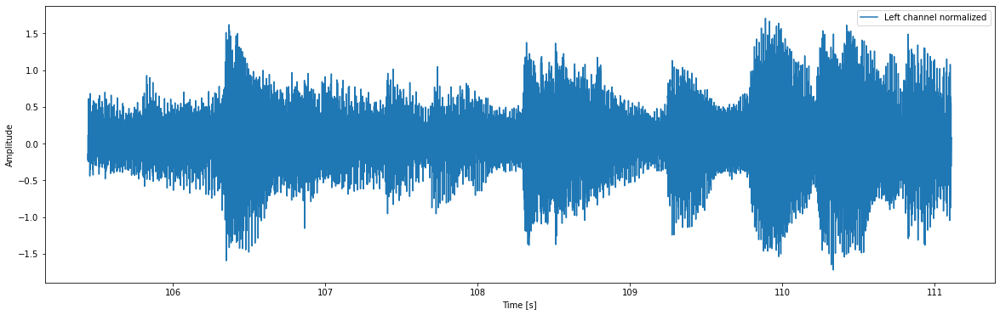

In [7]:
plt.rcParams["figure.figsize"] = (20,6) 
plt.plot(time[4650000:4900000], left, label="Left channel normalized")
plt.legend()
plt.xlabel("Time [s]")
plt.ylabel("Amplitude")
plt.show()

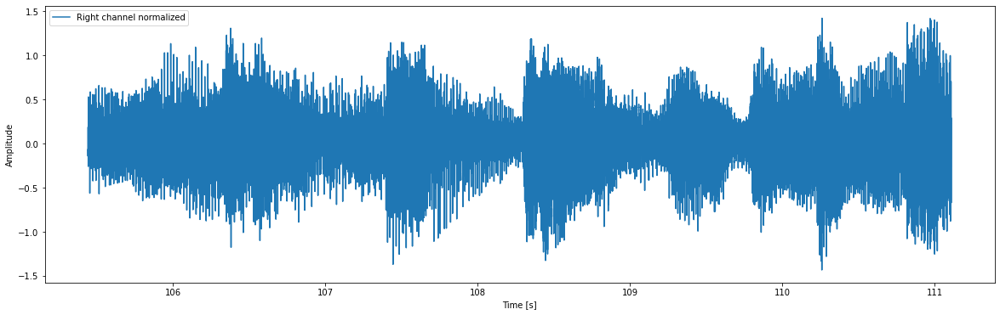

In [8]:
plt.plot(time[4650000:4900000], right, label="Right channel normalized")
plt.legend()
plt.xlabel("Time [s]")
plt.ylabel("Amplitude")
plt.show()

In [9]:
'''you can concatenate the normalized data again if you like
data2 = np.vstack((left,right))
data2=data2.T
data2.shape'''

'you can concatenate the normalized data again if you like\ndata2 = np.vstack((left,right))\ndata2=data2.T\ndata2.shape'

In [10]:
length_in_s = left.shape[0] / samplerate
print(f"sound track segment lasts {length_in_s} seconds")
print("coin falling part")

sound track segment lasts 5.668934240362812 seconds
coin falling part


In [11]:
#time series for plotting the 5.66 seconds on the horizontal axis
time = np.arange(left.shape[0]) / left.shape[0] * length_in_s
time.shape


(250000,)

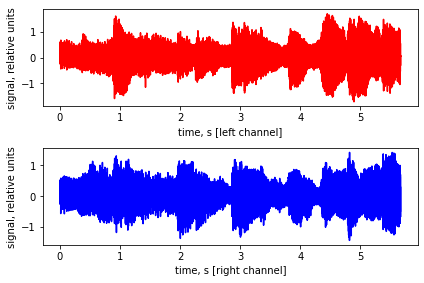

In [12]:
%matplotlib inline
plt.subplot(2,1,1)
plt.plot(time, left, 'r')
plt.xlabel("time, s [left channel]")
plt.ylabel("signal, relative units")
plt.subplot(2,1,2)
plt.plot(time, right, 'b')
plt.xlabel("time, s [right channel]")
plt.ylabel("signal, relative units")
plt.tight_layout()
plt.show()

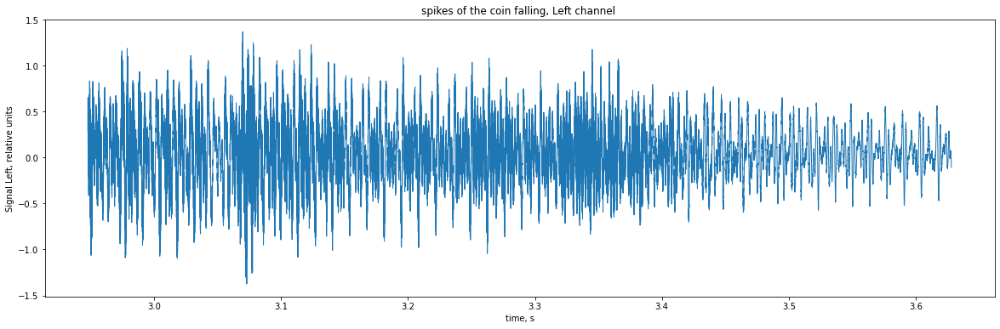

In [13]:
plt.rcParams["figure.figsize"] = (20,6)
plt.plot(time[130000:160000], left[130000:160000],linewidth=1)
plt.xlabel("time, s")
plt.ylabel("Signal Left, relative units")
plt.title('spikes of the coin falling, Left channel ')
plt.show()

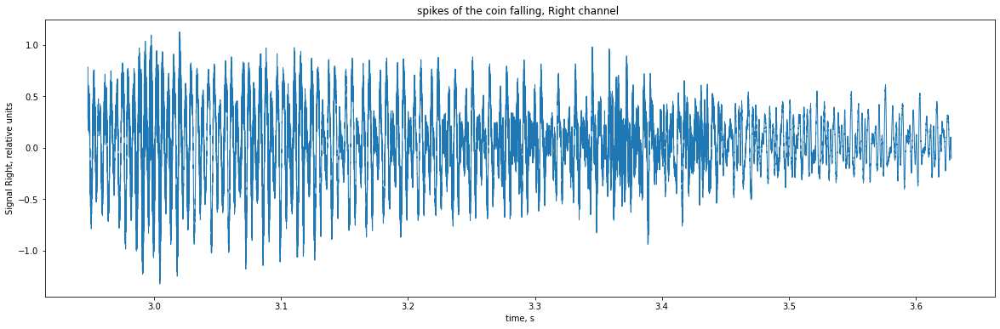

In [14]:
plt.rcParams["figure.figsize"] = (20,6)
plt.plot(time[130000:160000], right[130000:160000],linewidth=1)
plt.xlabel("time, s")
plt.ylabel("Signal Right, relative units")
plt.title('spikes of the coin falling, Right channel ')
plt.show()


In [15]:
fft_spectrum = np.fft.rfft(left)
freq = np.fft.rfftfreq(left.size, d=1./samplerate)

fft_spectrum2 = np.fft.rfft(right)
freq2 = np.fft.rfftfreq(right.size, d=1./samplerate)


In [16]:
#using np.abs to get the amplitude
fft_spectrum_abs = np.abs(fft_spectrum)
fft_spectrum_abs2 = np.abs(fft_spectrum2)

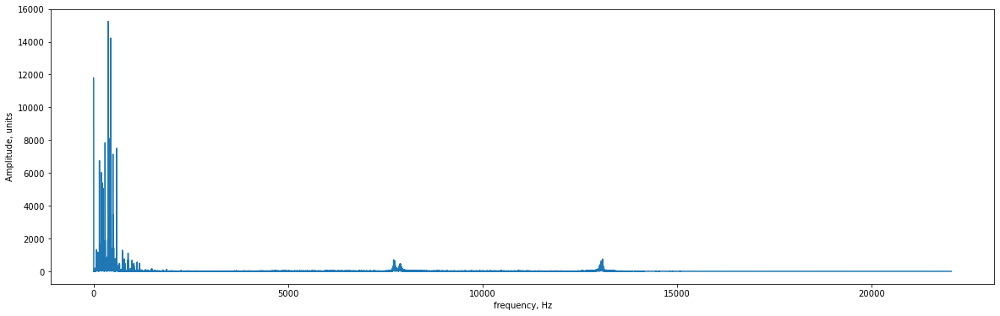

In [17]:
plt.plot(freq, fft_spectrum_abs)
plt.xlabel("frequency, Hz")
plt.ylabel("Amplitude, units")
plt.show()

In [18]:
hz_5000=pd.DataFrame(np.vstack([freq, fft_spectrum_abs])).T
hz_5000b=pd.DataFrame(np.vstack([freq2, fft_spectrum_abs2])).T

In [19]:
highranges=hz_5000[hz_5000[0]<634]
fig = px.line(highranges, x=0 ,y=1, title='Every spike here below 600hz is mostly noise(Left channel)',labels={'0':"Khz",'1':"Amplitude"})
fig.show()

In [20]:
highranges=hz_5000[hz_5000[0]>4000]
fig = px.line(highranges, x=0 ,y=1, title='Spikes at 7.8k, 8k and 13k are most likely the coin(Left channel)',labels={'0':"Khz",'1':"Amplitude"})
fig.show()

In [21]:
#Loop and search for specific combinations of frequency/amplitude
for i,f in enumerate(fft_spectrum_abs):
    if (f > 600) and (np.round(freq[i],1)>1000): 
        print('frequency = {} Hz with amplitude {} '.format(np.round(freq[i],1),  np.round(f)))

frequency = 7711.5 Hz with amplitude 603.0 
frequency = 7711.7 Hz with amplitude 639.0 
frequency = 7711.9 Hz with amplitude 674.0 
frequency = 7712.0 Hz with amplitude 695.0 
frequency = 7712.2 Hz with amplitude 703.0 
frequency = 7712.4 Hz with amplitude 699.0 
frequency = 7712.6 Hz with amplitude 688.0 
frequency = 7712.7 Hz with amplitude 676.0 
frequency = 7712.9 Hz with amplitude 655.0 
frequency = 7713.1 Hz with amplitude 620.0 
frequency = 7732.8 Hz with amplitude 615.0 
frequency = 7733.0 Hz with amplitude 631.0 
frequency = 7733.2 Hz with amplitude 627.0 
frequency = 7735.5 Hz with amplitude 609.0 
frequency = 7735.7 Hz with amplitude 603.0 
frequency = 7735.8 Hz with amplitude 622.0 
frequency = 7736.0 Hz with amplitude 641.0 
frequency = 7736.2 Hz with amplitude 621.0 
frequency = 13040.0 Hz with amplitude 603.0 
frequency = 13054.7 Hz with amplitude 623.0 
frequency = 13084.8 Hz with amplitude 684.0 
frequency = 13085.0 Hz with amplitude 749.0 
frequency = 13085.2 Hz with 

In [22]:
#we want to omin anything above 3000hz
#https://www.youtube.com/watch?v=rzDJ4xWRdE4
#especially if it has so high amplitude

In [23]:
left_signal_same5s=data[4650000:4900000,0]
left_signal_normal_distrib=(left_signal_same5s-left_signal_same5s.mean())/left_signal_same5s.std()
print(f"You can see the max value of the signal if we normalize this way: {left_signal_normal_distrib.max()}")
print(f"And the minimum: {left_signal_normal_distrib.min()}")
print("Play around by  recreating the fft_spectrum and freq variables by using this new signal")
print("A good idea would be to divide by 4 OR 2 like I do on the following block on commented lines")

You can see the max value of the signal if we normalize this way: 4.135135209772782
And the minimum: -4.403194027408686
Play around by  recreating the fft_spectrum and freq variables by using this new signal
A good idea would be to divide by 4


In [32]:
#You can recreate new spectrum and frequency variables
#fft_spectrum = np.fft.rfft(left_signal_normal_distrib/2)
#freq = np.fft.rfftfreq(left_signal_normal_distrib.size, d=1./samplerate)

a=0.3
b=0.5
c=0.7
d=0.05


#THIS IS ONLY AN EXAMPLE OF HOW TO reduce/remove your spikes
#FINAL RESULTS WILL VARY DEPENDING ON HOW YOU NORMALIZED THE SIGNAL, IF YOU WANT
#RICHER and VIBRANT SOUNDS, LET GO OF THE OF -1,1 RANGE AND OPT FOR SOMETHING LIKE -2, 2 ETC...
for i,f in enumerate(freq):
    if f<300:
           fft_spectrum[i] = a*fft_spectrum[i]
    if 300<f<740:
           fft_spectrum[i] = b*fft_spectrum[i]
    if 740<f<1000:
           fft_spectrum[i] = c*fft_spectrum[i]
    if 1000<f<2000:
           fft_spectrum[i] = 1*fft_spectrum[i]
    if 2000<f<4000:
           fft_spectrum[i] = b*fft_spectrum[i]
    if 4000<f<5000:
           fft_spectrum[i] = d*fft_spectrum[i]
    if 5000<f<6500:
           fft_spectrum[i] = 0*fft_spectrum[i]
    if f>6500:
           fft_spectrum[i] = 0*fft_spectrum[i]
        




In [33]:
noiseless_signal = (np.fft.irfft(fft_spectrum))

wavfile.write("noiseless_left.wav", samplerate, noiseless_signal)